In [20]:
# Question 1
'''
Imagine you’re working with Sprint, one of the biggest Telecom companies in the USA. 
They’re really keen on figuring out how many customers might decide to leave them in the coming months. 
Luckily, they’ve got a bunch of past data about when customers have left before, as well as info about 
who these customers are, what they’ve bought, and other things like that. So, if you were in charge of 
predicting customer churn how would you go about using machine learning to make a good guess about which 
customers might leave? Like, what steps would you take to create a machine learning model that can predict 
if someone’s going to leave or not?
'''
# import the required  libraries 
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import math


dt = pd.read_csv("/home/x38fed/Documents/GitHub/Python_Programming-/churnDataSet/telecom_customer_churn.csv")
# Set pandas options to display the entire DataFrame in a single cell
pd.set_option('display.max_columns', None)
pd.set_option('display.expand_frame_repr', False)

# Confirmation of the total number of Customers by calling the function
# dt.head(7043)


dt.head(7043)






,Customer ID,Gender,Age,Married,Number of Dependents,City,Zip Code,Latitude,Longitude,Number of Referrals,Tenure in Months,Offer,Phone Service,Avg Monthly Long Distance Charges,Multiple Lines,Internet Service,Internet Type,Avg Monthly GB Download,Online Security,Online Backup,Device Protection Plan,Premium Tech Support,Streaming TV,Streaming Movies,Streaming Music,Unlimited Data,Contract,Paperless Billing,Payment Method,Monthly Charge,Total Charges,Total Refunds,Total Extra Data Charges,Total Long Distance Charges,Total Revenue,Customer Status,Churn Category,Churn Reason
0,0002-ORFBO,Female,37,Yes,0,Frazier Park,93225,34.827662,-118.999073,2,9,NaN,Yes,42.39,No,Yes,Cable,16.0,No,Yes,No,Yes,Yes,No,No,Yes,One Year,Yes,Credit Card,65.60,593.30,0.00,0,381.51,974.81,Stayed,NaN,NaN
1,0003-MKNFE,Male,46,No,0,Glendale,91206,34.162515,-118.203869,0,9,NaN,Yes,10.69,Yes,Yes,Cable,10.0,No,No,No,No,No,Yes,Yes,No,Month-to-Month,No,Credit Card,-4.00,542.40,38.33,10,96.21,610.28,Stayed,NaN,NaN
2,0004-TLHLJ,Male,50,No,0,Costa Mesa,92627,33.645672,-117.922613,0,4,Offer E,Yes,33.65,No,Yes,Fiber Optic,30.0,No,No,Yes,No,No,No,No,Yes,Month-to-Month,Yes,Bank Withdrawal,73.90,280.85,0.00,0,134.60,415.45,Churned,Competitor,Competitor had better devices
3,0011-IGKFF,Male,78,Yes,0,Martinez,94553,38.014457,-122.115432,1,13,Offer D,Yes,27.82,No,Yes,Fiber Optic,4.0,No,Yes,Yes,No,Yes,Yes,No,Yes,Month-to-Month,Yes,Bank Withdrawal,98.00,1237.85,0.00,0,361.66,1599.51,Churned,Dissatisfaction,Product dissatisfaction
4,0013-EXCHZ,Female,75,Yes,0,Camarillo,93010,34.227846,-119.079903,3,3,NaN,Yes,7.38,No,Yes,Fiber Optic,11.0,No,No,No,Yes,Yes,No,No,Yes,Month-to-Month,Yes,Credit Card,83.90,267.40,0.00,0,22.14,289.54,Churned,Dissatisfaction,Network reliability
5,0013-MHZWF,Female,23,No,3,Midpines,95345,37.581496,-119.972762,0,9,Offer E,Yes,16.77,No,Yes,Cable,73.0,No,No,No,Yes,Yes,Yes,Yes,Yes,Month-to-Month,Yes,Credit Card,69.40,571.45,0.00,0,150.93,722.38,Stayed,NaN,NaN
6,0013-SMEOE,Female,67,Yes,0,Lompoc,93437,34.757477,-120.550507,1,71,Offer A,Yes,9.96,No,Yes,Fiber Optic,14.0,Yes,Yes,Yes,Yes,Yes,Yes,Yes,Yes,Two Year,Yes,Bank Withdrawal,109.70,7904.25,0.00,0,707.16,8611.41,Stayed,NaN,NaN
7,0014-BMAQU,Male,52,Yes,0,Napa,94558,38.489789,-122.270110,8,63,Offer B,Yes,12.96,Yes,Yes,Fiber Optic,7.0,Yes,No,No,Yes,No,No,No,No,Two Year,Yes,Credit Card,84.65,5377.80,0.00,20,816.48,6214.28,Stayed,NaN,NaN
8,0015-UOCOJ,Female,68,No,0,Simi Valley,93063,34.296813,-118.685703,0,7,Offer E,Yes,10.53,No,Yes,DSL,21.0,Yes,No,No,No,No,No,No,Yes,Two Year,Yes,Bank Withdrawal,48.20,340.35,0.00,0,73.71,414.06,Stayed,NaN,NaN
9,0016-QLJIS,Female,43,Yes,1,Sheridan,95681,38.984756,-121.345074,3,65,NaN,Yes,28.46,Yes,Yes,Cable,14.0,Yes,Yes,Yes,Yes,Yes,Yes,Yes,Yes,Two Year,Yes,Credit Card,90.45,5957.90,0.00,0,1849.90,7807.80,Stayed,NaN,NaN


In [25]:
print('---------------------------------------------+-------------------------------------------------------------------------')
# Select the desired columns
churnCategories = ['Customer Status', 'Churn Category', 'Churn Reason']

# Create a new DataFrame with only the selected columns
selectedColumns = dt[churnCategories]

# Display the entire DataFrame
pd.set_option('display.max_rows', None)  # Show all rows
#print(selectedColumns)

# Create a boolean mask to identify rows with NaN values
nan_rows = selectedColumns.isnull().any(axis=1)

# Filter rows with NaN values and create a new DataFrame
filteredNaN = selectedColumns[~nan_rows]

# Display the filtered DataFrame

print(filteredNaN)

print('--------------------------------------------+------------------------------------------------------------------------')




---------------------------------------------+-------------------------------------------------------------------------
     Customer Status   Churn Category                               Churn Reason
2            Churned       Competitor              Competitor had better devices
3            Churned  Dissatisfaction                    Product dissatisfaction
4            Churned  Dissatisfaction                        Network reliability
18           Churned  Dissatisfaction                  Limited range of services
19           Churned       Competitor               Competitor made better offer
21           Churned            Other                                 Don't know
24           Churned            Price                      Long distance charges
25           Churned         Attitude               Attitude of service provider
40           Churned       Competitor               Competitor made better offer
53           Churned       Competitor              Competitor had bett

TypeError: argument of type 'float' is not iterable

In [27]:
import numpy as np

# Define a function to categorize reasons
def categorize_reason(reason):
    if pd.isna(reason):
        return "No Reason"  # You can choose an appropriate category for NaN values
    elif "Competitor had better devices" in reason:
        return "Competitor had better devices"
    elif "Product dissatisfaction" in reason:
        return "Product dissatisfaction"
    elif "Network reliability" in reason:
        return "Network reliability"
    elif "Limited range of services" in reason:
        return "Limited range of services"
    elif "Competitor made better offer" in reason:
        return "Competitor made better offer"
    elif "Don't know" in reason:
        return "Don't know"
    elif "Long distance charges" in reason:
        return "Long distance charges"
    elif "Attitude of service provider" in reason:
        return "Attitude of service provider"
    else:
        return "Other"

# Apply the categorization function to create a new column 'Categorized Reason'
dt['Categorized Reason'] = dt['Churn Reason'].apply(categorize_reason)

# Display the DataFrame with the new 'Categorized Reason' column
print(dt[['Churn Reason', 'Categorized Reason']])


                                   Churn Reason             Categorized Reason
0                                           NaN                      No Reason
1                                           NaN                      No Reason
2                 Competitor had better devices  Competitor had better devices
3                       Product dissatisfaction        Product dissatisfaction
4                           Network reliability            Network reliability
5                                           NaN                      No Reason
6                                           NaN                      No Reason
7                                           NaN                      No Reason
8                                           NaN                      No Reason
9                                           NaN                      No Reason
10                                          NaN                      No Reason
11                                          NaN     

In [28]:
# Calculate summary statistics for the 'Categorized Reason' column
reason_stats = dt['Categorized Reason'].describe()

# Display the summary statistics
print(reason_stats)


count          7043
unique           10
top       No Reason
freq           5174
Name: Categorized Reason, dtype: object


In [29]:
# Calculate value counts for the 'Churn Category' column
churn_category_stats = dt['Churn Category'].value_counts()

# Display the summary statistics
print(churn_category_stats)


Churn Category
Competitor         841
Dissatisfaction    321
Attitude           314
Price              211
Other              182
Name: count, dtype: int64


In [39]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, classification_report

# Specify the list of feature columns from your dataset
feature_columns = ['Churn Reason']  # Add more feature columns as needed

# Assuming 'X' contains your feature columns and 'y' contains your target column ('Churn Category')
X = dt[feature_columns]
y = dt['Churn Category']

# Drop rows with missing values
X = X.dropna()
y = y[X.index]  # Match the target labels with the filtered features

# Apply one-hot encoding to the 'Churn Reason' column
X = pd.get_dummies(X, columns=['Churn Reason'], drop_first=True)

# Split the data into training and testing sets (e.g., 80% train, 20% test)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Initialize and train a logistic regression model
model = LogisticRegression()
model.fit(X_train, y_train)

# Make predictions on the test data
y_pred = model.predict(X_test)

# Evaluate the model's performance
accuracy = accuracy_score(y_test, y_pred)
classification_rep = classification_report(y_test, y_pred)

print(f'Accuracy: {accuracy}')
print('Classification Report:')
print(classification_rep)




Accuracy: 1.0
Classification Report:
                 precision    recall  f1-score   support

       Attitude       1.00      1.00      1.00        56
     Competitor       1.00      1.00      1.00       175
Dissatisfaction       1.00      1.00      1.00        62
          Other       1.00      1.00      1.00        40
          Price       1.00      1.00      1.00        41

       accuracy                           1.00       374
      macro avg       1.00      1.00      1.00       374
   weighted avg       1.00      1.00      1.00       374



/home/x38fed/.local/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/home/x38fed/.local/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/home/x38fed/.local/lib/python3.11/site-packages/seaborn/_oldcore.py:1765: FutureWarning: unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.
  order = pd.unique(vector)
/home/x38fed/.local/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.ap

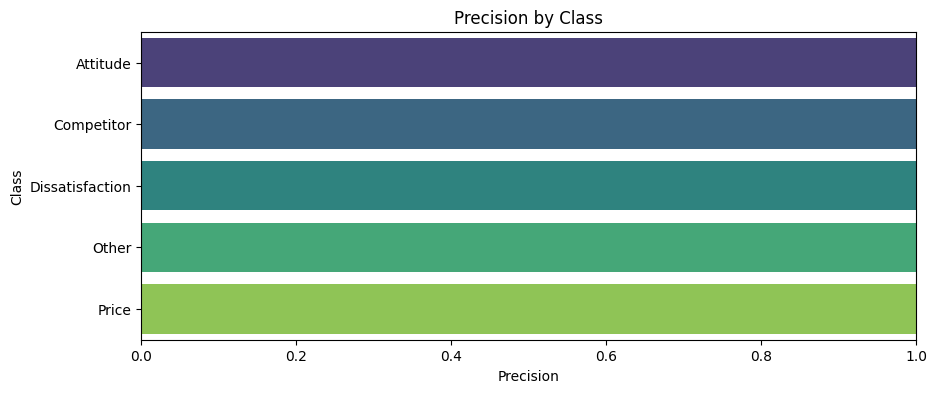

/home/x38fed/.local/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/home/x38fed/.local/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/home/x38fed/.local/lib/python3.11/site-packages/seaborn/_oldcore.py:1765: FutureWarning: unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.
  order = pd.unique(vector)
/home/x38fed/.local/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.ap

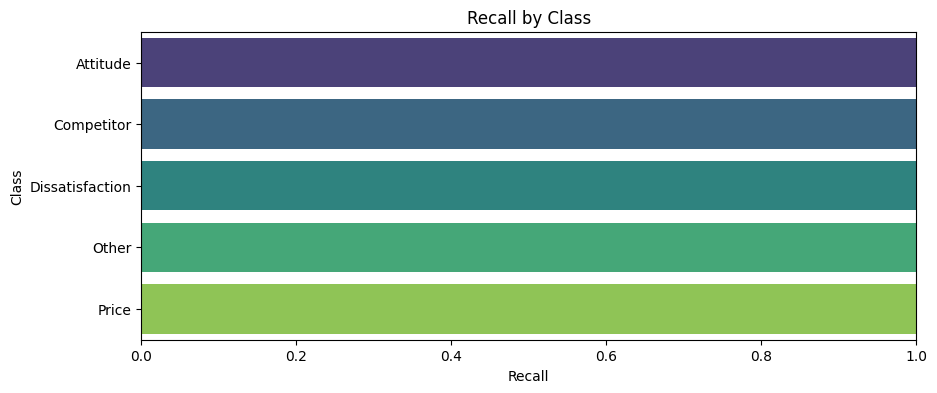

/home/x38fed/.local/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/home/x38fed/.local/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/home/x38fed/.local/lib/python3.11/site-packages/seaborn/_oldcore.py:1765: FutureWarning: unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.
  order = pd.unique(vector)
/home/x38fed/.local/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.ap

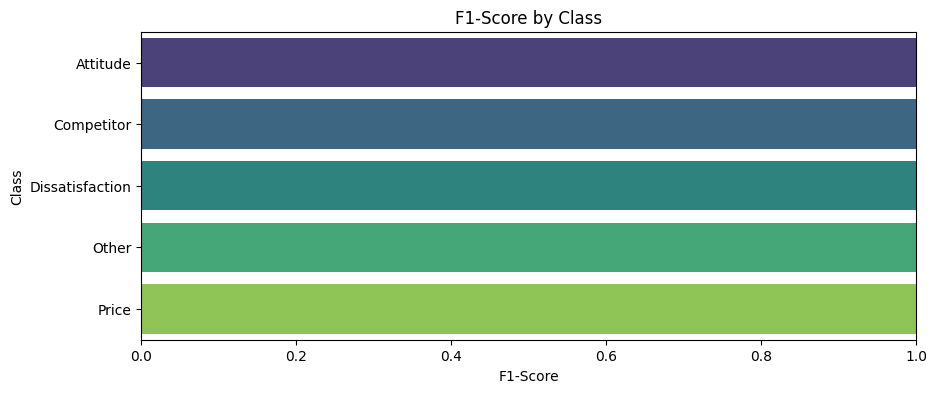

In [40]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import classification_report

# Replace these values with the actual values from your classification report
class_names = ['Attitude', 'Competitor', 'Dissatisfaction', 'Other', 'Price']
precision = [1.00, 1.00, 1.00, 1.00, 1.00]
recall = [1.00, 1.00, 1.00, 1.00, 1.00]
f1_score = [1.00, 1.00, 1.00, 1.00, 1.00]

# Create a bar plot for precision
plt.figure(figsize=(10, 4))
sns.barplot(x=precision, y=class_names, palette='viridis')
plt.title('Precision by Class')
plt.xlabel('Precision')
plt.ylabel('Class')
plt.xlim(0, 1.0)
plt.show()

# Create a bar plot for recall
plt.figure(figsize=(10, 4))
sns.barplot(x=recall, y=class_names, palette='viridis')
plt.title('Recall by Class')
plt.xlabel('Recall')
plt.ylabel('Class')
plt.xlim(0, 1.0)
plt.show()

# Create a bar plot for F1-score
plt.figure(figsize=(10, 4))
sns.barplot(x=f1_score, y=class_names, palette='viridis')
plt.title('F1-Score by Class')
plt.xlabel('F1-Score')
plt.ylabel('Class')
plt.xlim(0, 1.0)
plt.show()


/home/x38fed/.local/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/home/x38fed/.local/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/home/x38fed/.local/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/home/x38fed/.local/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead


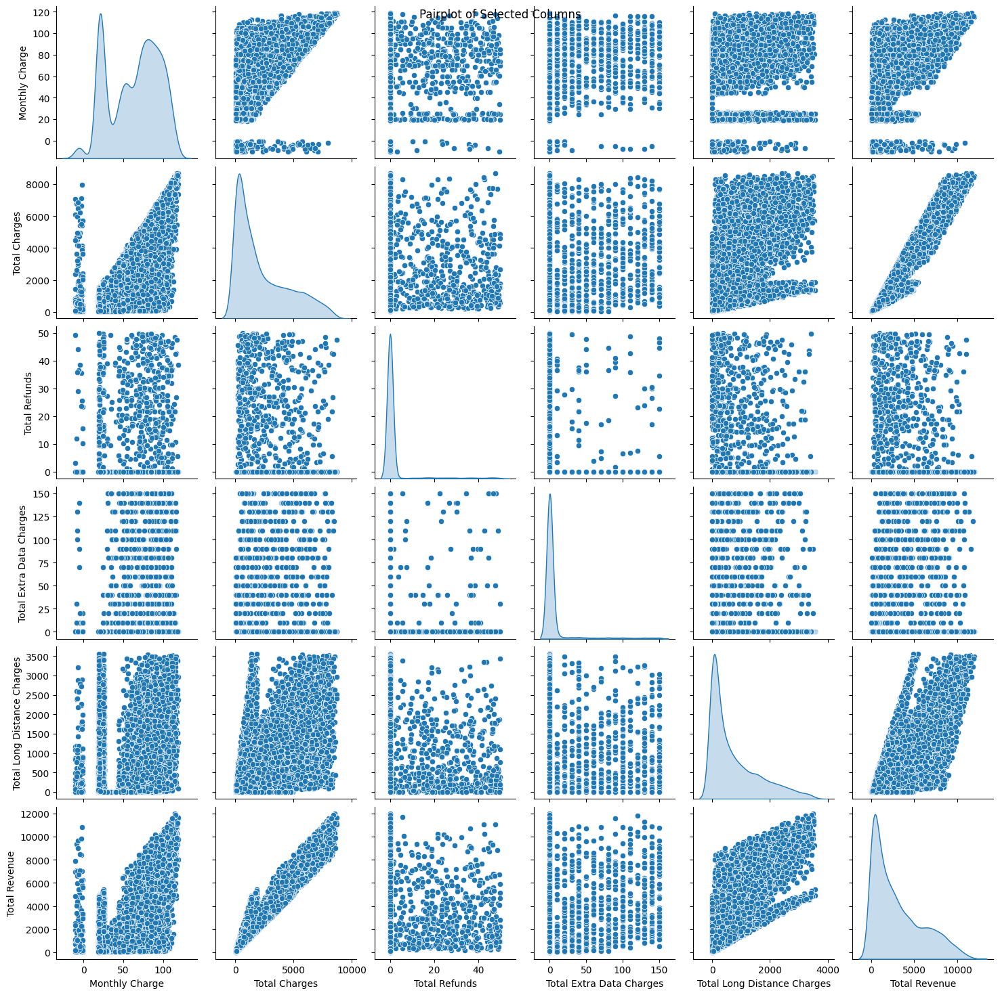

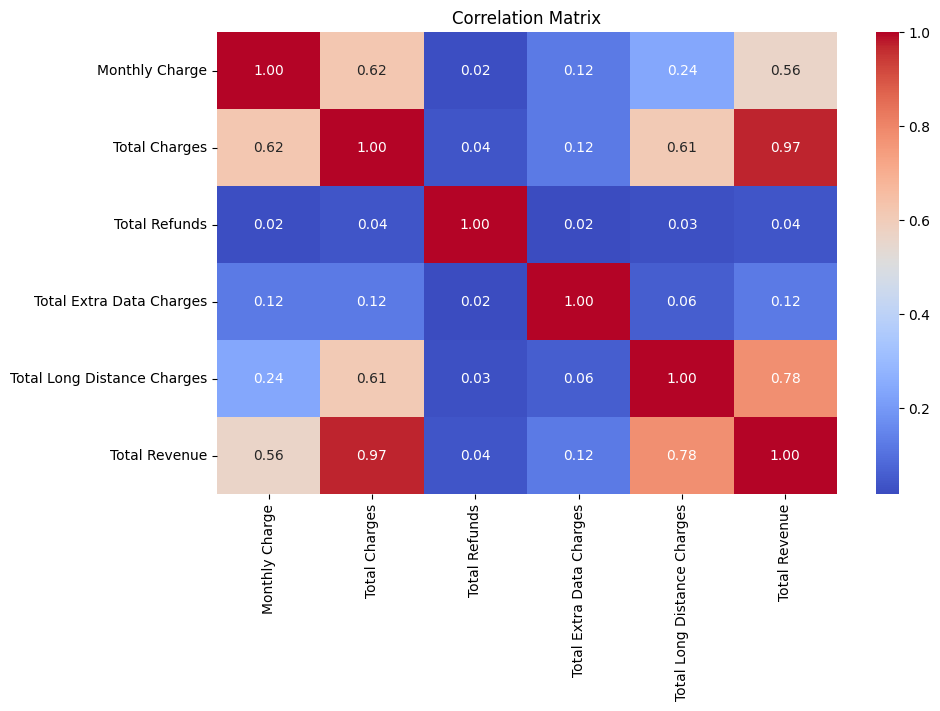

In [41]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming 'dt' is your DataFrame containing the mentioned columns
selected_columns = ['Monthly Charge', 'Total Charges', 'Total Refunds', 
                    'Total Extra Data Charges', 'Total Long Distance Charges', 'Total Revenue']

# Create a pairplot to visualize relationships between columns
sns.pairplot(dt[selected_columns], diag_kind='kde')
plt.suptitle("Pairplot of Selected Columns")
plt.show()

# Calculate and visualize the correlation matrix
correlation_matrix = dt[selected_columns].corr()
plt.figure(figsize=(10, 6))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f')
plt.title("Correlation Matrix")
plt.show()
